## 1 Value Function: Guess and Verify

### 1. Consider the following Bellman equation:
$$
V(k)=\max _{k^{\prime}}\left\{\ln \left(A k^{a}-k^{\prime}\right)+\beta V\left(k^{\prime}\right)\right\}
$$
We guess that the solution is of the following form:
$$
\begin{aligned}
V(k) &=d+c \log k \\
k^{\prime} &=e A k^{\alpha}
\end{aligned}
$$
Verify this guess and solve for $c, d, e$. Explain the intuitions.


$$
d+c \log k = \max _{k^{\prime}}\left\{\ln \left(A k^{a}-e A k^{\alpha}\right)+\beta \left(d+c \log \left( e A k^{\alpha}\right) \right)\right\}
$$

$$
d+c \log k = \max _{k^{\prime}}\left\{\ln A + \ln \left(1-e\right) + \alpha\ln k +\beta \left(d+c \left( \ln e + \ln A \right) + \alpha c \ln k \right)\right\}
$$

$$
Euler[k^{\prime}]  : \frac{\partial}{\partial k^{\prime}} [\ln \left(A k^{a}-k^{\prime}\right)+\beta V\left(k^{\prime}\right)]
$$

$$
U^{\prime}\left(c\right) = \beta V^{\prime}\left(k^{\prime}\right)
$$

$$
\frac{+1}{A k^{a}-k^{\prime}} = \frac{\beta c}{k^{\prime}}
$$

$$
Replace\ k^{\prime} \\
\frac{+1}{A k^{a}-e A k^{\alpha}} = \frac{\beta c}{eAk^{\alpha}}
$$

$$
\Rightarrow e = \frac{\beta c}{A+\beta c}
$$

$$
d = \ln A + \ln \left(1-e\right) +\beta [d+c \left( \ln e + \ln A \right)]
$$

$$
c = \alpha + \beta \alpha c \Rightarrow c = \frac{\alpha}{1 - \beta \alpha} \Rightarrow e = \frac{\frac{\beta\alpha}{1 - \beta \alpha}}{A + \frac{\beta\alpha}{1 - \beta \alpha}}
$$ 

### 2. Consider the following Bellman equation:
$$
V(k)=\max _{k^{\prime}}\left\{\left(A k^{a}-k^{\prime}\right)+\beta V\left(k^{\prime}\right)\right\}
$$
We guess that the solution is of the following form:
$$
\begin{aligned}
V(k) &=c A k^{\alpha}+d \\
k^{\prime} &=k^{*}
\end{aligned}
$$
Verify this guess and solve for $c, d, k^{*}$. Explain the intuitions.

$$
c A k^{\alpha}+d = \max _{k^{\prime}}\left\{\left(A k^{a}-k^{\prime}\right)+\beta \left(c A k^{\prime^{\alpha}}+d\right)\right\}
$$

$$
= \left( A k^{a}-k^{*} \right) +\beta \left(c A k^{*^{\alpha}}+d\right)
$$

$$
c=1\ , d =  -k^{\alpha}+\beta \left(c A k^{*^{\alpha}}+d\right)
$$

$$
Euler[k^{\prime}]  : 1 + \beta \alpha c A k^{\prime^{\alpha - 1}} \Rightarrow k^{\prime} = {\frac {1}{\beta \alpha c A}}^{\frac {1}{\alpha - 1}}
$$

## 2 Value Function Calculation

The steady state level of capital: 
The first order condition is
$$
p_{k}\left[A K^{\alpha}+p_{k}(1-\delta) K-p_{k} K^{\prime}\right]^{-\sigma}=\beta V^{\prime}\left(K^{\prime}\right)
$$
The envelope condition is
$$
V^{\prime}(K)=\left[A K^{\alpha}+p_{k}(1-\delta) K-p_{k} K^{\prime}\right]^{-\sigma}\left[\alpha A K^{\alpha-1}+p_{k}(1-\delta)\right]
$$
Replacing the envelope condition into the FOC and evaluating it at the steady state (i.e. $K=K^{\prime}=K^{*}$ ) we obtain
$$
p_{k}=\beta\left[A \alpha\left(K^{*}\right)^{\alpha-1}+p_{k}(1-\delta)\right]
$$
Solving for $K^{*}$ :
$$
K^{*}=\left[\frac{A \alpha}{p_{k}(\rho+\delta)}\right]^{1 /(1-\alpha)}
$$
where $\rho$ is defined by $\beta \equiv \frac{1}{1+\rho}$.

In [1]:
using Plots, Interpolations, Optim, ForwardDiff

In [4]:
function Bellman_Solver(θ, F, tol)
    A, α, δ, p, σ, β, N = θ
    N = Int64(N)

    Γ(k) = min(A * k^α / p + (1-δ) * k, K_max)

    #𝑖
    ρ = 1 / β - 1
    K_star = ((A * α) / (p * (ρ + δ))) ^ (1 / (1 - α))

    #𝑖𝑖
    K_min = 0.95*K_star
    K_max = K_star
    K_grid = collect(range(0.0, K_max, length = N))

    #𝑖𝑖𝑖
    V = [K_grid] #Initial Guess
    dist = 1
    K_prime = zeros(N)
    V1 = zeros(N)
    
    #𝑖𝑣
    while dist > tol
        V⁰ = LinearInterpolation(K_grid, V[end])
        for i ∈ 1:N
            Ω(k′) = -(F(K_grid[i], k′) + β * V⁰(k′))
            K_prime[i] = optimize(Ω, 0.0, Γ(K_grid[i])).minimizer
            V1[i] = -Ω(K_prime[i])
        end

        dist = maximum(abs.(V1 .- V[end]))
        append!(V, [V1])
        V1 = zeros(N)
    end
    
    I = [K_prime[i] - (1 - δ) * K_grid[i] for i ∈ 1:N]
    C = [A * K_grid[i]^α - p * (K_prime[i] - (1 - δ) * K_grid[i]) for i ∈ 1:N]

    return V, LinearInterpolation(K_grid, K_prime), K_grid, LinearInterpolation(K_grid, C), LinearInterpolation(K_grid, I), K_star
end

Bellman_Solver (generic function with 1 method)

In [5]:
A = 1
α = 0.66
δ = 0.1
p = 1
σ = 0.1
β = 0.9
N = 2000
tol = 10^-7
θ = [A, α, δ, p, σ, β, N]
f(x) = (A * x^α) + (p * (1 - δ) * x)
F(x, y) = (f(x) - (p * y)) > 0 ? ((f(x) - (p * y))^(1-σ)) / (1-σ) : 0
V, K′, K, C, I, kss = Bellman_Solver(θ, F, 10^-7);

In [9]:
K[end]

28.57452060886588

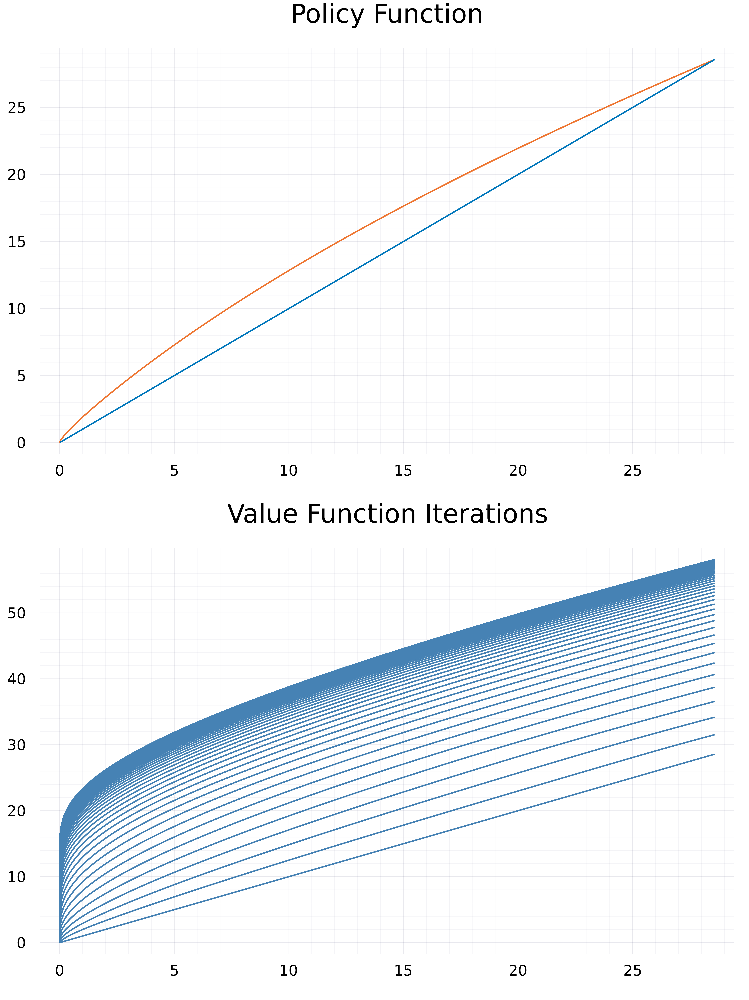

In [6]:
kk(x) = K′(x)
theme(:vibrant)
p1 = plot(kk, K, legend = false, title = "Policy Function")
p1 = plot!(K, K)
p2 = plot(K, V, color = "steelblue", legend = false, title = "Value Function Iterations")
plot(p1, p2, layout = (2, 1), size = (600, 800), dpi = 1000)

### Constructing TimeSeries 

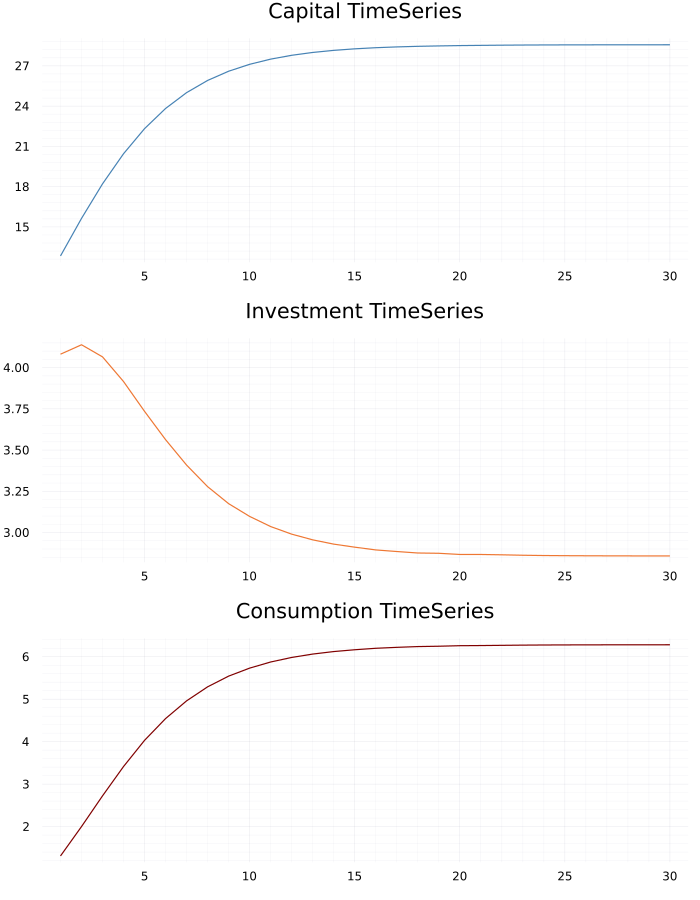

In [7]:
function to_timeseries(k₀, T; K = K′, I = missing, C = missing)
    k(T) = T == 1 ? K(k₀) : K(k(T-1))
    result = [k(i) for i ∈ 1:T]
    if !ismissing(I)
        result = I.(result)
    elseif !ismissing(C)
        result = C.(result)
    end
    return result
end

#Capital TimeSeries
Capital = to_timeseries(10, 30, K = K′)
p1 = plot(Capital, title = "Capital TimeSeries", color = "steelblue", legend = false)

#Investment TimeSeries
Investment = to_timeseries(10, 30, I = I)
p2 = plot(Investment, title = "Investment TimeSeries", legend = false)

#Consumption TimeSeries
Consumption = to_timeseries(10, 30, C = C)
p3 = plot(Consumption, title = "Consumption TimeSeries", color = "maroon", legend = false)

plot(p1, p2, p3, layout = (3, 1), size = (700, 900), dpi = 1000)